# [Car Object Detection](https://www.kaggle.com/datasets/sshikamaru/car-object-detection)

## Reference

1 [ASHISHSINGH226, "Car-Detection-Using-MaskRCNN"](https://www.kaggle.com/code/ashishsingh226/car-detection-using-maskrcnn)  
2 [Jason Brownlee, "How to Train an Object Detection Model with Keras", Machine Learning Maestry, Sep.2020](https://machinelearningmastery.com/how-to-train-an-object-detection-model-with-keras/)  
3 [ligerlac,"Mask-RCNN-TF2-10", github](https://github.com/ligerlac/Mask-RCNN-TF2-10)

In [1]:
INPUT_DIR:str = "../01_input"
TRAIN_DIR:str = INPUT_DIR + "/training_images"
TEST_DIR:str = INPUT_DIR + "/testing_images"
ANALYSIS_DIR:str = "../03_code-analysis"
MODEL_DIR:str = "..//04_model"
SUBMISSION_DIR:str = '../05_submission'
CHECKPOINT_PATH:str = MODEL_DIR

In [2]:
import os, shutil
if os.path.isdir(MODEL_DIR):
    shutil.rmtree(MODEL_DIR)

## 1. Importing and Installing libraries

In [3]:
#!git clone https://github.com/matterport/Mask_RCNN.git
#!cd Mask_RCNN && python setup.py install

### Refference
1 git clone https://github.com/ahmedfgad/Mask-RCNN-TF2.git  
2 git clone https://github.com/ligerlac/Mask-RCNN-TF2-10.git  
3 git clone https://github.com/devVipin01/Mask-RCNN-For-Tf-2.0.git  

In [4]:
'''
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
tf.enable_eager_execution()
tf.executing_eagerly()
'''

'\nimport tensorflow.compat.v1 as tf\ntf.disable_v2_behavior()\ntf.enable_eager_execution()\ntf.executing_eagerly()\n'

[stack overflow "AttributeError: module 'keras.engine' has no attribute 'Layer'"](https://stackoverflow.com/questions/68012351/attributeerror-module-keras-engine-has-no-attribute-layer)

In [5]:
import os,sys
import pandas as pd
import numpy as np
from os import listdir
from numpy import zeros, asarray, expand_dims, mean
from matplotlib import pyplot

ROOT_DIR = os.path.abspath("../Mask_RCNN")
sys.path.append(ROOT_DIR)

import mrcnn
import mrcnn.utils
import mrcnn.config
import mrcnn.model
import mrcnn.visualize

import warnings
warnings.filterwarnings("ignore")

Instructions for updating:
non-resource variables are not supported in the long term


In [6]:
bb_df = pd.read_csv(INPUT_DIR+'/train_solution_bounding_boxes.csv')

In [7]:
bb_df.head() #displaying the first couple of rows

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


In [8]:
bb_df.nunique() #count of unique values in the dataset

image    355
xmin     440
ymin     149
xmax     438
ymax     184
dtype: int64

In [9]:
class CarsDataset(mrcnn.utils.Dataset):
    '''
    Dataset class to load the images and their bounding boxes in the form of masks
    '''
    def load_dataset(self, dataset_dir=INPUT_DIR+'/', mode='train'):
        '''
        This function is used to load the dataset. We will only use 500 images for training the rest are for validation.
        We also have test set for which we dont have labels but are useful for visually checking
        for how effective the training was
        '''
        self.add_class('dataset',1,'car')
        if mode=='train':
            images_dir = dataset_dir + 'training_images/'
            for i in range(500):
                image_id = bb_df.iloc[i,0]
                img_path = images_dir + image_id
                self.add_image('dataset', image_id=image_id, path=img_path)
        if mode=='val':
            images_dir = dataset_dir + 'training_images/'
            for i in range(500,len(bb_df)):
                image_id = bb_df.iloc[i,0]
                img_path = images_dir + image_id
                self.add_image('dataset', image_id=image_id, path=img_path)
        if mode=='test':
            images_dir = dataset_dir + 'testing_images/'
            for filename in listdir(images_dir):
                image_id = filename
                img_path = images_dir + filename
                self.add_image('dataset', image_id=image_id, path=img_path)

    def extract_boxes(self, filename):
        '''
        To get the coordinates of the bounding boxes.
        '''
        boxes = list()
        xmin = int(bb_df[bb_df['image']==filename].iloc[0,1])
        ymin = int(bb_df[bb_df['image']==filename].iloc[0,2])
        xmax = int(bb_df[bb_df['image']==filename].iloc[0,3])
        ymax = int(bb_df[bb_df['image']==filename].iloc[0,4])
        coors = [xmin, ymin, xmax, ymax]
        boxes.append(coors)
        width = 380
        height = 676
        return boxes, width, height
    def load_mask(self, image_id):
        '''
        Takes the co-ordinates and uses that to make it into a mask.
        '''
        info = self.image_info[image_id]
        file = info['id']
        boxes, w, h = self.extract_boxes(file)
        masks = zeros([w, h, len(boxes)], dtype='uint8')
        class_ids = list()
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1
            class_ids.append(self.class_names.index('car'))
        return masks, asarray(class_ids, dtype='int32')

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

In [10]:
#Loading all the datasets we will need.
train_set = CarsDataset()
train_set.load_dataset(mode='train')
train_set.prepare()
print('Train: %d' % len(train_set.image_ids))

val_set = CarsDataset()
val_set.load_dataset(mode='val')
val_set.prepare()
print('Validate: %d' % len(val_set.image_ids))

test_set = CarsDataset()
test_set.load_dataset(mode='test')
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Train: 500
Validate: 59
Test: 175


In [11]:
def plot(num_img=5):
    for i in range(num_img):
        image_id = np.random.randint(0,len(train_set.image_ids))
        image = train_set.load_image(image_id)
        mask, class_ids = train_set.load_mask(image_id)
        pyplot.imshow(image)
        pyplot.imshow(mask[:, :, 0], cmap='gray', alpha=0.3)
        pyplot.show()

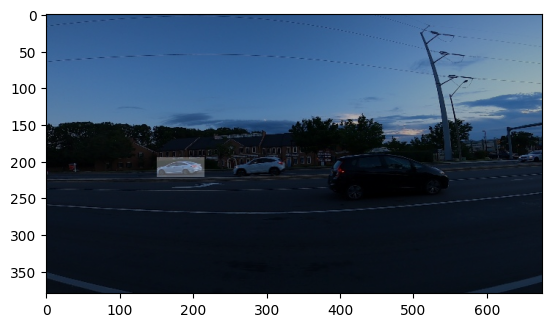

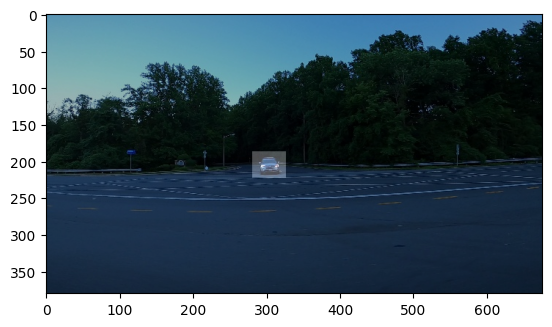

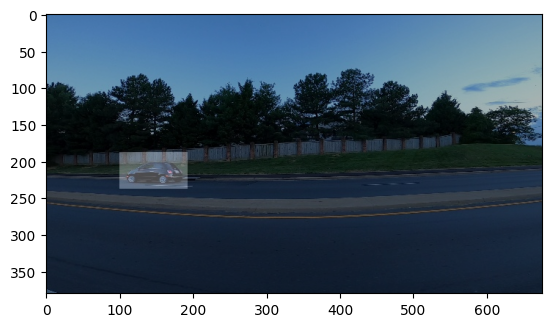

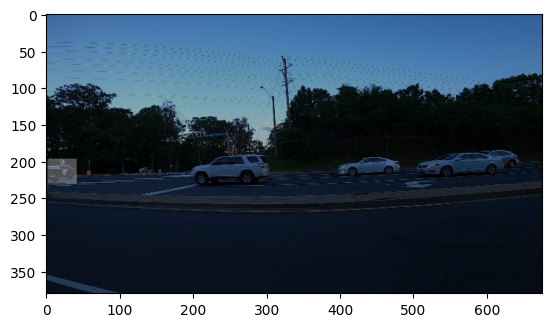

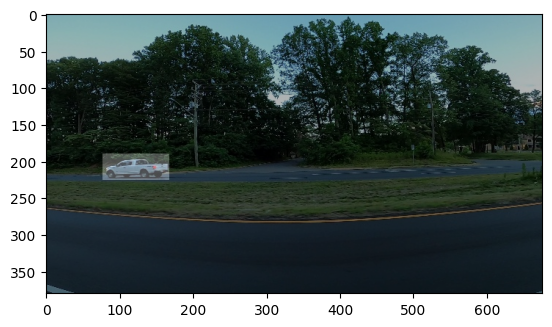

In [12]:
plot()

## Training

This config file contains a lot of important parameters for model training.

In [13]:
class CarsConfig(mrcnn.config.Config):
    NAME = "cars_cfg"
    NUM_CLASSES = 2 #Bckground is counted as class too so background + cars = 2 labels
    STEPS_PER_EPOCH = 200
    VALIDATION_STEPS = 20
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 384
    IMAGE_MAX_DIM = 448
    USE_MINI_MASK = False

config = CarsConfig()

In [14]:
config.display() #list of all available configurations


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  448
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  384
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [448 448   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

### Referrence
1 [stack overflow, "I am trying to build a object detection using Mask RCNN and get an error when i call MaskRCNN method"](https://stackoverflow.com/questions/67559783/i-am-trying-to-build-a-object-detection-using-mask-rcnn-and-get-an-error-when-i)  
2 [Dr. Pascal Giessler, "Huggingface Installation on Apple Silicon 2022 (M1/Pro/Max/Ultra/M2)", Medium - This artcle about how to solve the problem "No module named 'keras.engine'. "](https://medium.com/@pmgiessler/kudos-to-you-5512c602c88)  
3 [Arvind (Yetirajan) Narayanan Iyengar, "How to detect objects using Mask-RCNN with Tensorflow = 2.4.1 and Keras = 2.4.3", Medium](https://arvindn-iitkgp.medium.com/how-to-detect-objects-using-mask-rcnn-with-tensorflow-2-4-1-and-keras-2-4-3-c6b56f25c251)  
4 [stack overflow, "Why Keras Lambda-Layer cause problem Mask_RCNN?"](https://stackoverflow.com/questions/65073434/why-keras-lambda-layer-cause-problem-mask-rcnn)  
5 [github, "'SGD' object has no attribute 'get_updates'"](https://github.com/matterport/Mask_RCNN/issues/2977)  
6 [github, "Input image dtype is bool. Interpolation is not defined with bool data type."](https://github.com/matterport/Mask_RCNN/issues/2243)

In [15]:
model = mrcnn.model.MaskRCNN(mode='training', model_dir=MODEL_DIR, config=config)

We are going to load pre-trained weights for this task. This will save us a lot of time because these algorithms can take a lot of time to converge

In [16]:
#!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5

In [17]:
model.load_weights('../mask_rcnn_coco.h5', by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2024-07-16 17:16:08.990390: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-07-16 17:16:08.999855: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-07-16 17:16:09.128409: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-07-16 17:16:09.716246: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


In [25]:
model.train(train_set, val_set, learning_rate=config.LEARNING_RATE, epochs=10, layers='all')

AssertionError: Create model in training mode.

## Evaluation

We need to define a seperate config file for predictions purposes.

In [19]:
class PredictionConfig(mrcnn.config.Config):
    NAME = "cars_cfg"
    NUM_CLASSES = 2
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    USE_MINI_MASK = False

In [20]:
cfg = PredictionConfig()
model = mrcnn.model.MaskRCNN(mode='inference', model_dir=MODEL_DIR,config=cfg)

Instructions for updating:
Use fn_output_signature instead


In [21]:
cfg.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE          

Loading the saved weights to perform inference.

In [22]:
for i in os.listdir(MODEL_DIR):
    if i[:4]=='cars':
        path=i
model.load_weights(MODEL_DIR+'/'+path+'/mask_rcnn_cars_cfg_0010.h5', by_name=True) # ????.h5の4桁はtrainのepoch数と同じ

2024-07-16 21:07:38.892325: W tensorflow/c/c_api.cc:304] Operation '{name:'res2a_branch2a/kernel/Assign' id:82 op device:{requested: '', assigned: ''} def:{{{node res2a_branch2a/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](res2a_branch2a/kernel, res2a_branch2a/kernel/Initializer/random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-07-16 21:07:40.273378: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Re-starting from epoch 10


Here we will calculate mean average precision for our model. To know in detail what it means try referring to this blog https://towardsdatascience.com/map-mean-average-precision-might-confuse-you-5956f1bfa9e2

This code is made with reffering below the url.  
[github, "Calculating mean Average Recall (mAR), mean Average Precision (mAP) and F1-Score #2513"](https://github.com/matterport/Mask_RCNN/issues/2513)

In [23]:
def evaluate_model(dataset, model, cfg, list_iou_thresholds=None):

    if list_iou_thresholds is None: list_iou_thresholds = np.arange(0.5, 1.01, 0.1)

    APs = []
    ARs = []
    for image_id in dataset.image_ids:
		
        image, image_meta, gt_class_id, gt_bbox, gt_mask = mrcnn.model.load_image_gt(dataset, cfg, image_id, augmentation=False)
		
        scaled_image = mrcnn.model.mold_image(image, cfg)
        sample = np.expand_dims(scaled_image, 0)
        yhat = model.detect(sample, verbose=0)
		
        r = yhat[0]
        AP, precisions, recalls, overlaps = mrcnn.utils.compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.5)
        
        AR = mrcnn.utils.compute_ar(r['rois'], gt_bbox, list_iou_thresholds)
        ARs.append(AR)
        APs.append(AP)

    mAP = mean(APs)
    mAR = mean(ARs)
    f1_score = 2 * ((mAP * mAR) / (mAP + mAR))

    return mAP, mAR, f1_score

In [24]:
train_mAP = evaluate_model(train_set, model, cfg)
print("Train mAP: %.3f" % train_mAP,)
val_mAP = evaluate_model(val_set, model, cfg)
print("Validation mAP: %.3f" % val_mAP,)

2024-07-16 21:07:42.426349: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-07-16 21:07:42.667023: W tensorflow/c/c_api.cc:304] Operation '{name:'bn2b_branch2b_1/moving_mean/Assign' id:17690 op device:{requested: '', assigned: ''} def:{{{node bn2b_branch2b_1/moving_mean/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bn2b_branch2b_1/moving_mean, bn2b_branch2b_1/moving_mean/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-07-16 21:07:42.900932: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-07-16 21:07:54.648147: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registr

TypeError: not all arguments converted during string formatting

## Actual vs Predicted

Fianlly we will compare our model preformances by simply seeing how well it is detecting cars compared to the real bounding boxes.

In [26]:
from matplotlib.patches import Rectangle
def plot_actual_vs_predicted(dataset, model, cfg, n_images=5):
    for i in range(n_images):
        id = np.random.randint(0,len(dataset.image_ids))
        pyplot.figure(figsize=(50, 50))
        image = dataset.load_image(id)
        mask, _ = dataset.load_mask(id)
        scaled_image = mrcnn.model.mold_image(image, cfg)
        sample = expand_dims(scaled_image, 0)
        yhat = model.detect(sample, verbose=0)[0]
        pyplot.subplot(n_images, 2, i*2+1)
        pyplot.imshow(image)
        pyplot.title('Actual')
        for j in range(mask.shape[2]):
            pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
        pyplot.subplot(n_images, 2, i*2+2)
        pyplot.imshow(image)
        pyplot.title('Predicted')
        ax = pyplot.gca()
        for box in yhat['rois']:
            y1, x1, y2, x2 = box
            width, height = x2 - x1, y2 - y1
            rect = Rectangle((x1, y1), width, height, fill=False, color='red')
            ax.add_patch(rect)
    pyplot.show()

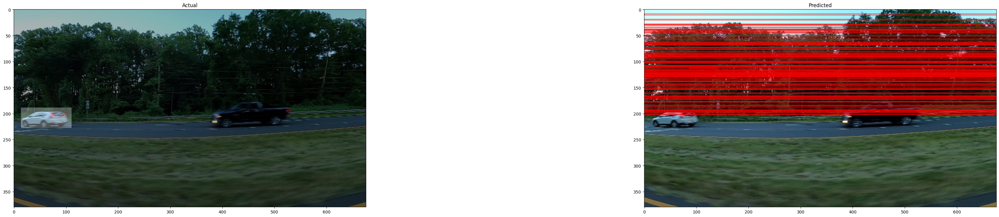

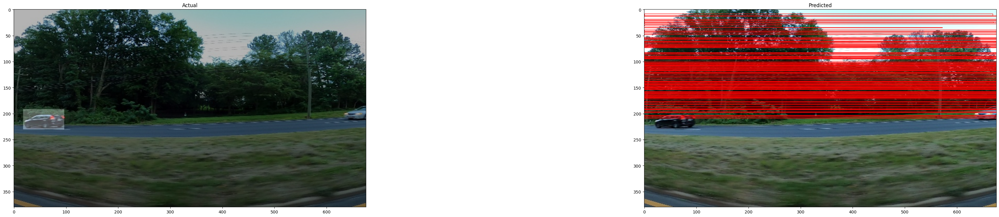

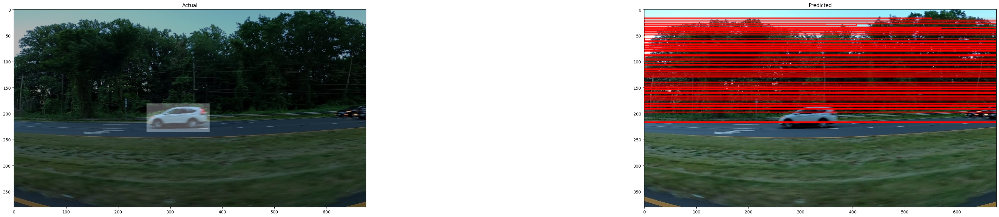

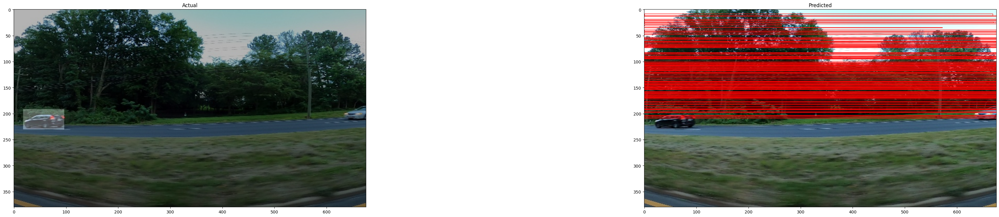

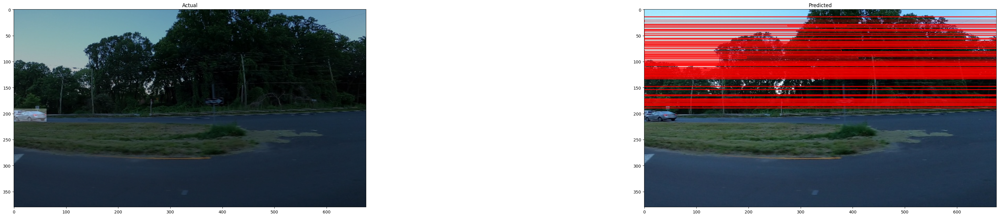

In [27]:
plot_actual_vs_predicted(val_set, model, cfg)